In [1]:
!git clone https://github.com/pedropro/TACO.git

Cloning into 'TACO'...
remote: Enumerating objects: 740, done.
remote: Counting objects: 100% (435/435), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 740 (delta 416), reused 380 (delta 380), pack-reused 305 (from 1)
Receiving objects: 100% (740/740), 97.48 MiB | 15.40 MiB/s, done.
Resolving deltas: 100% (499/499), done.


In [2]:
%cd TACO
!python3 download.py
%cd ..

/content/TACO
Note. If for any reason the connection is broken. Just call me again and I will start where I left.
Finished
/content


In [3]:
import os

# Check the number of batch folders downloaded
data_path = 'TACO/data/'
batches = [folder for folder in os.listdir(data_path) if folder.startswith('batch_')]
print(f"Total number of batches: {len(batches)}")

Total number of batches: 15


In [4]:
import json

# Load the annotations file
with open('TACO/data/annotations.json') as f:
    data = json.load(f)

In [5]:
import json
import os
import cv2
import matplotlib.pyplot as plt

# Path to the TACO annotations JSON file
annotations_path = 'TACO/data/annotations.json'

# Load the annotations file
with open(annotations_path) as f:
    annotations = json.load(f)

# Create dictionaries for images and annotations
images_dict = {img['id']: img for img in annotations['images']}
annotations_dict = {ann['image_id']: [] for ann in annotations['annotations']}
for ann in annotations['annotations']:
    annotations_dict[ann['image_id']].append(ann)

In [6]:
# Extract categories and annotations from the JSON data
categories = {cat['id']: cat['name'] for cat in data['categories']}
annotations = data['annotations']
images = {img['id']: img for img in data['images']}

def show_image_with_boxes(image_id):
    # Find the corresponding image info
    image_info = images[image_id]
    image_path = f"TACO/data/{image_info['file_name']}"

    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Could not load image: {image_path}")
        return

    # Convert to RGB (OpenCV uses BGR by default)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filter annotations for this image
    image_annotations = [ann for ann in annotations if ann['image_id'] == image_info['id']]

    # Draw bounding boxes and category labels
    for ann in image_annotations:
        # Get bbox coordinates (x, y, width, height)
        x, y, width, height = ann['bbox']
        category_id = ann['category_id']
        category_name = categories[category_id]

        # Draw the bounding box
        cv2.rectangle(image, (int(x), int(y)), (int(x + width), int(y + height)), (0, 255, 0), 2)

        # Add the category label in red
        label = f"{category_name}"
        cv2.putText(image, label, (int(x), int(y) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
        #Put the category label in white
        #cv2.putText(image, label,(int(x), int(y) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8,(255, 255, 255), 2, cv2.LINE_AA)

    # Display the image with bounding boxes and labels
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.show()


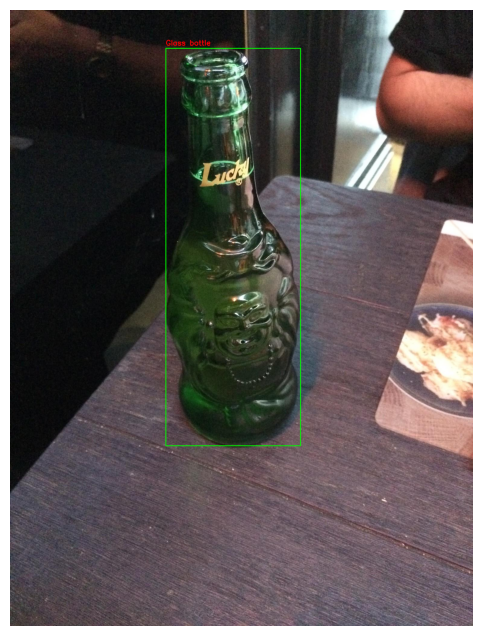

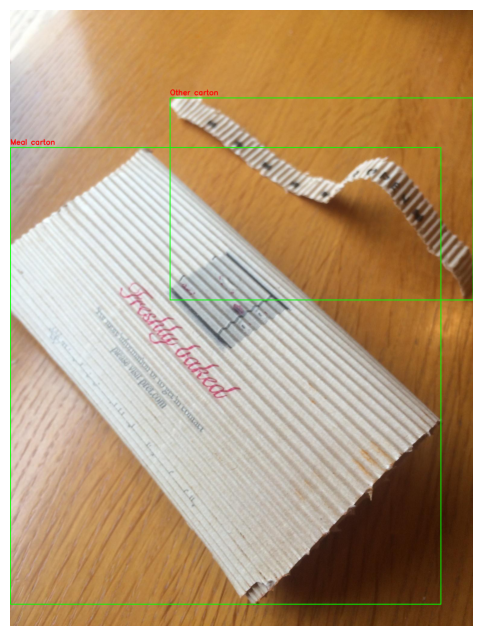

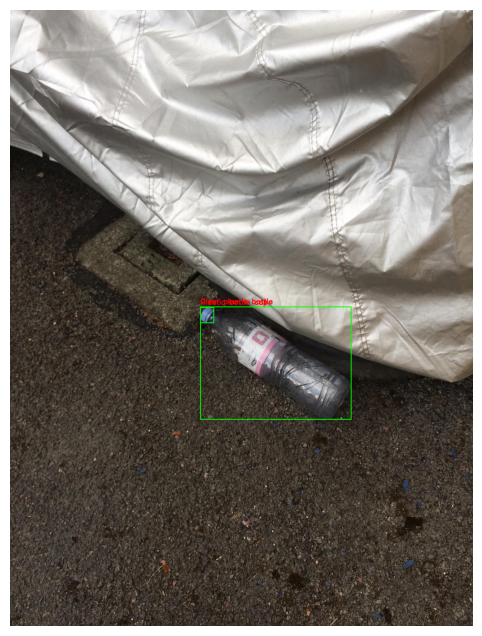

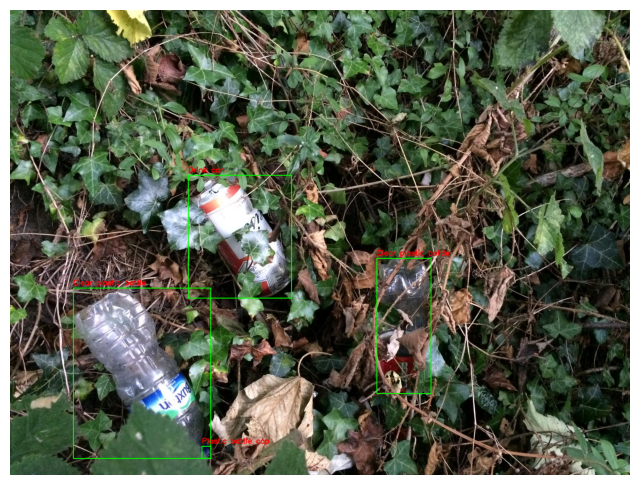

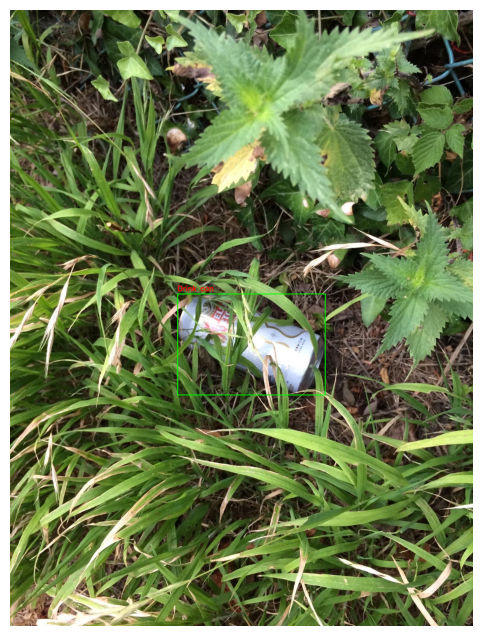

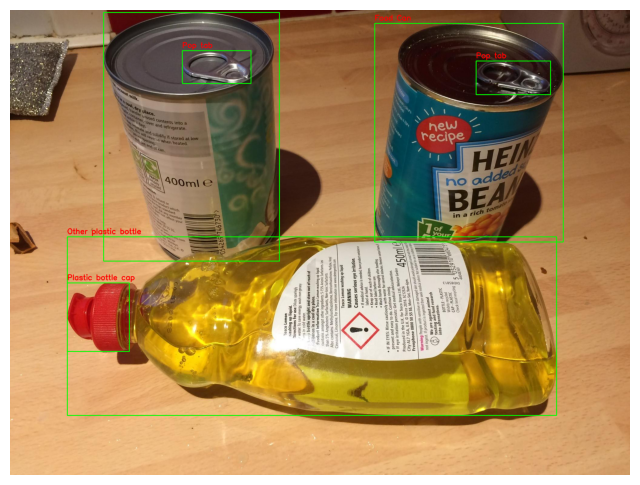

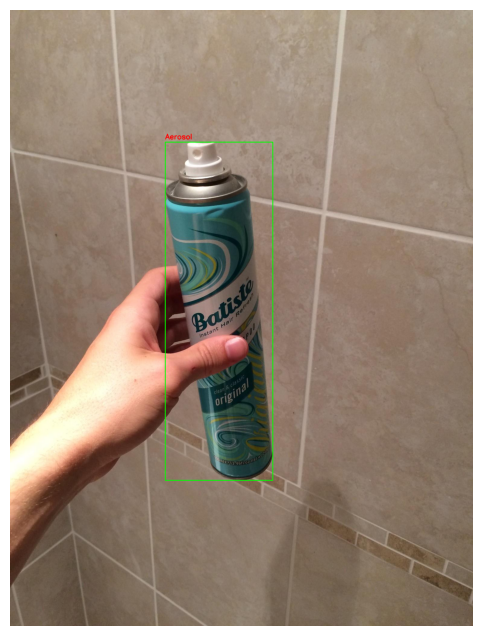

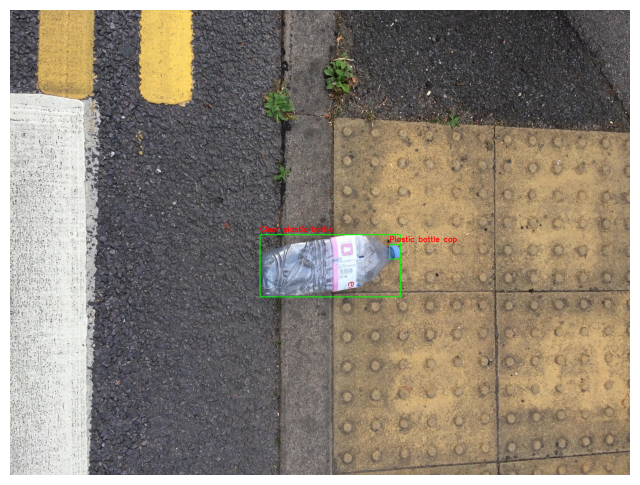

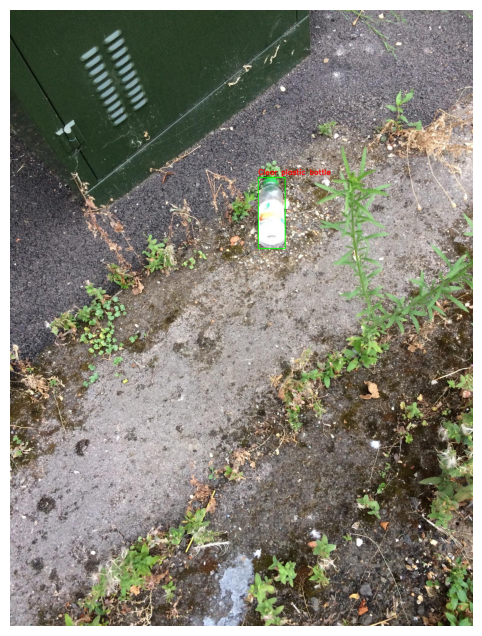

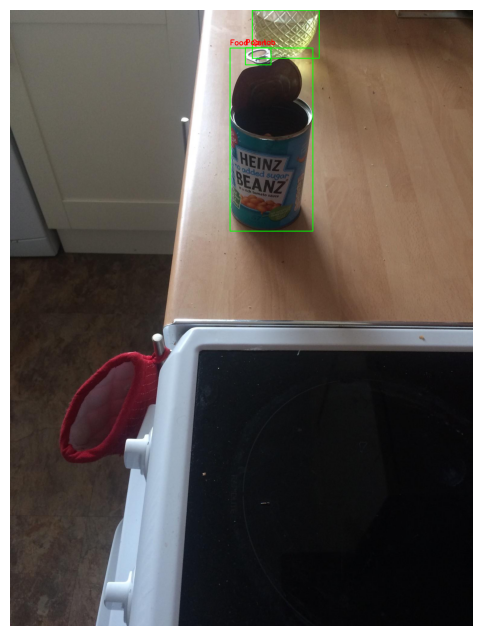

In [7]:
# Show the first 10 images with bounding boxes and category labels
for i in range(10):
    show_image_with_boxes(i)

In [8]:
# Extract categories from the annotations data
categories = data.get('categories', [])

# Create a dictionary to store supercategories and their corresponding categories
supercategory_dict = {}

# Iterate over categories to group them by supercategory
for category in categories:
    supercategory = category.get('supercategory', 'Uncategorized')  # Default to 'Uncategorized' if no supercategory
    category_name = category.get('name', 'Unknown Category')

    # Add the category under the corresponding supercategory
    if supercategory not in supercategory_dict:
        supercategory_dict[supercategory] = []
    supercategory_dict[supercategory].append(category_name)

# Now print each supercategory and its categories
for supercategory, category_list in supercategory_dict.items():
    print(f"Supercategory: {supercategory}")
    for category in category_list:
        print(f" - {category}")
    print()  # Add an empty line for readability


Supercategory: Aluminium foil
 - Aluminium foil

Supercategory: Battery
 - Battery

Supercategory: Blister pack
 - Aluminium blister pack
 - Carded blister pack

Supercategory: Bottle
 - Other plastic bottle
 - Clear plastic bottle
 - Glass bottle

Supercategory: Bottle cap
 - Plastic bottle cap
 - Metal bottle cap

Supercategory: Broken glass
 - Broken glass

Supercategory: Can
 - Food Can
 - Aerosol
 - Drink can

Supercategory: Carton
 - Toilet tube
 - Other carton
 - Egg carton
 - Drink carton
 - Corrugated carton
 - Meal carton
 - Pizza box

Supercategory: Cup
 - Paper cup
 - Disposable plastic cup
 - Foam cup
 - Glass cup
 - Other plastic cup

Supercategory: Food waste
 - Food waste

Supercategory: Glass jar
 - Glass jar

Supercategory: Lid
 - Plastic lid
 - Metal lid

Supercategory: Other plastic
 - Other plastic

Supercategory: Paper
 - Magazine paper
 - Tissues
 - Wrapping paper
 - Normal paper

Supercategory: Paper bag
 - Paper bag
 - Plastified paper bag

Supercategory: Plast

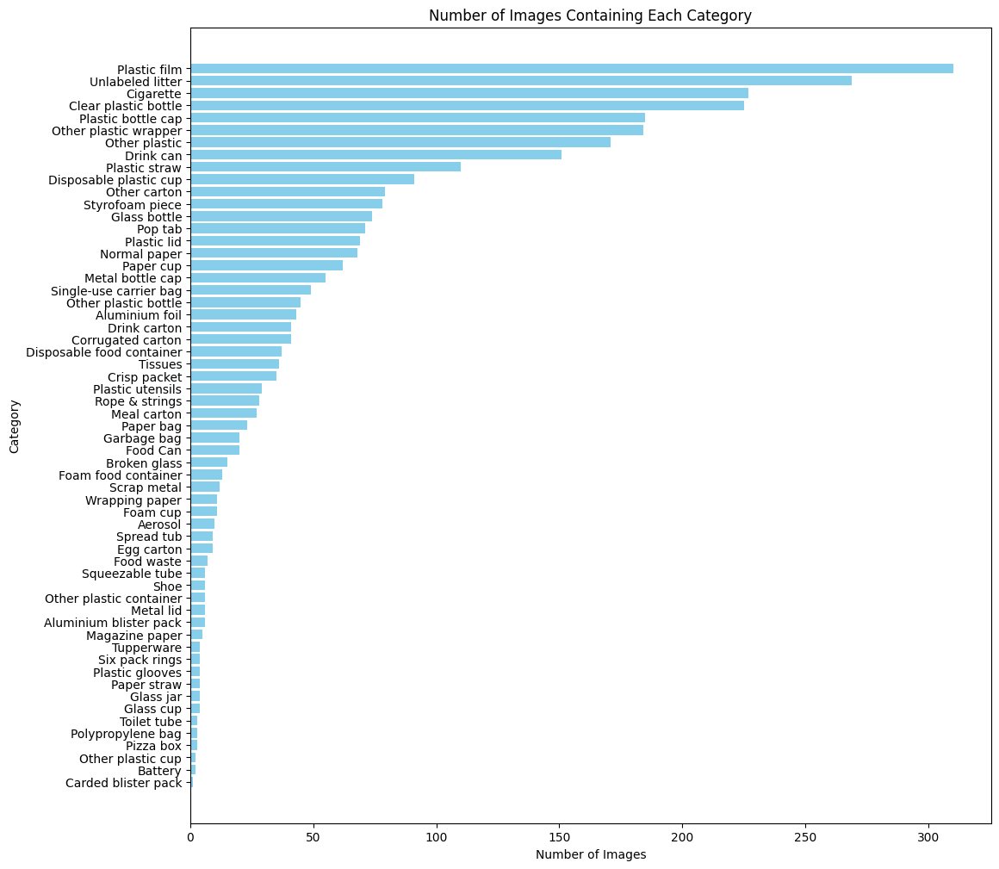

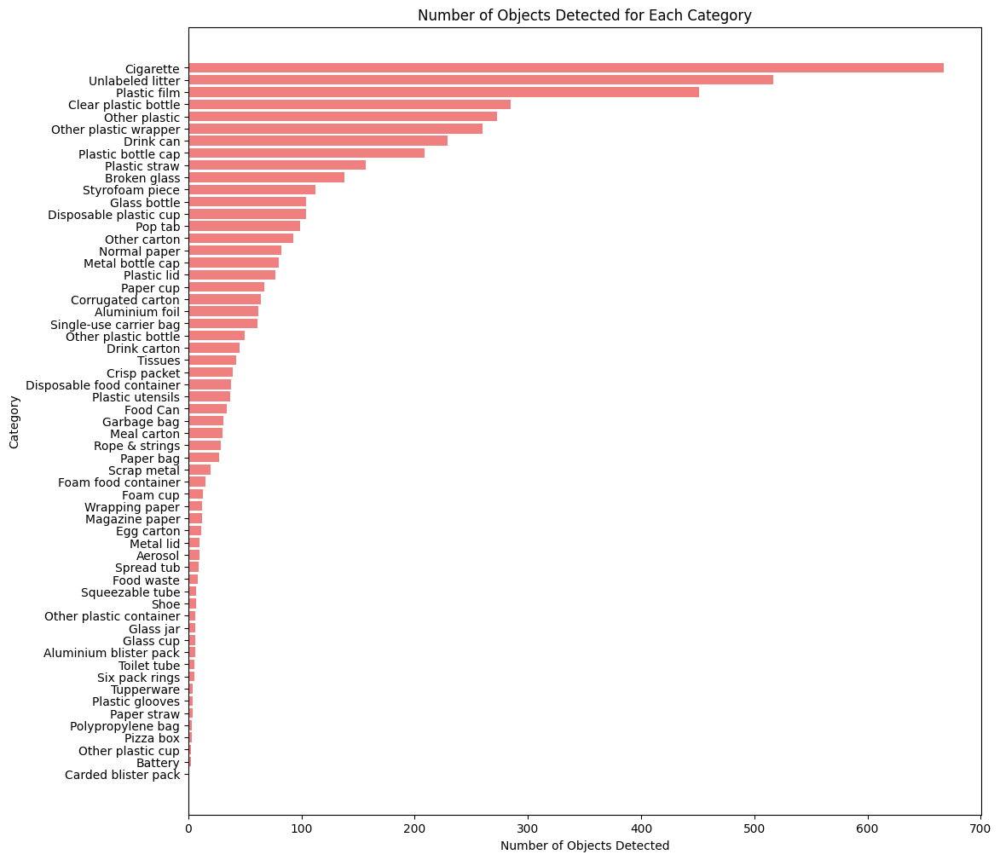

In [9]:
from collections import defaultdict

# Extract the annotations and categories
annotations = data.get('annotations', [])
categories = data.get('categories', [])

# Create a mapping for category ids to names
category_id_to_name = {category['id']: category['name'] for category in categories}

# Create dictionaries to count images per category and objects per category
image_count_per_category = defaultdict(set)  # Uses a set to avoid counting the same image multiple times
object_count_per_category = defaultdict(int)

# Initialize total counts for calculating mean objects per image
total_objects = 0
unique_images = set()

# Iterate through annotations
for annotation in annotations:
    image_id = annotation['image_id']
    category_id = annotation['category_id']

    # Update the image count for the category (one image may contain multiple categories)
    image_count_per_category[category_id].add(image_id)

    # Update the object count for the category
    object_count_per_category[category_id] += 1

    # Update total objects and images
    total_objects += 1

    # Add image_id to the set of unique images
    unique_images.add(image_id)

# Convert image counts from sets to actual counts
image_count_per_category = {cat_id: len(images) for cat_id, images in image_count_per_category.items()}

# Convert category ids to category names for easier plotting
category_names = [category_id_to_name[cat_id] for cat_id in image_count_per_category.keys()]
image_counts = list(image_count_per_category.values())

# The total number of unique images
total_images = len(unique_images)

# Sort categories by number of images (descending order)
sorted_image_counts, sorted_category_names = zip(*sorted(zip(image_counts, category_names), reverse=False))

# Plot the histogram of number of images containing each category (sorted)
plt.figure(figsize=(12, 12))
plt.barh(sorted_category_names, sorted_image_counts, color='skyblue')
plt.xlabel('Number of Images')
plt.ylabel('Category')
plt.title('Number of Images Containing Each Category')
plt.show()

# Sort categories by number of objects (descending order)
object_counts = [object_count_per_category[cat_id] for cat_id in image_count_per_category.keys()]
sorted_object_counts, sorted_category_names_objects = zip(*sorted(zip(object_counts, category_names), reverse=False))

# Plot the histogram of number of objects detected for each category (sorted)
plt.figure(figsize=(12, 12))
plt.barh(sorted_category_names_objects, sorted_object_counts, color='lightcoral')
plt.xlabel('Number of Objects Detected')
plt.ylabel('Category')
plt.title('Number of Objects Detected for Each Category')
plt.show()


In [10]:
# Calculate mean number of objects per image
mean_objects_per_image = round(total_objects / total_images, 2) if total_images != 0 else 0
print(f'Mean number of objects per image: {mean_objects_per_image}')

Mean number of objects per image: 3.19


## Converting Data into YOLO format

In [11]:
import json
import os
from pathlib import Path
import shutil

# Paths to your TACO dataset
coco_json_path = 'TACO/data/annotations.json'  # Path to TACO's annotations file
images_dir = 'TACO/data'                       # Path to TACO's main image directory with batch subfolders
output_dir = 'yolo_top_categories'             # Base directory for YOLO format

# Ensure output directories for images and labels
Path(output_dir, 'images').mkdir(parents=True, exist_ok=True)
Path(output_dir, 'labels').mkdir(parents=True, exist_ok=True)

# Load TACO annotations
with open(coco_json_path, 'r') as f:
    data = json.load(f)

# Get category mappings
categories = {category['id']: category['name'] for category in data['categories']}

# Counter for unique filenames
file_counter = 1

# Process each image and corresponding annotations
for img in data['images']:
    img_id = img['id']
    img_file_name = img['file_name']  # This should be in the format 'batch_x/filename.jpg'
    img_width, img_height = img['width'], img['height']

    # Derive the image path within one of the 15 batch folders
    img_path = os.path.join(images_dir, img_file_name)

    # Create a unique integer-based name for each image and label
    unique_name = str(file_counter)
    img_extension = os.path.splitext(img_file_name)[1]  # Preserve the original extension (e.g., .jpg, .png)

    # Copy image to the images directory with the new unique name
    output_image_path = os.path.join(output_dir, 'images', unique_name + img_extension)
    if os.path.exists(img_path):
        shutil.copy(img_path, output_image_path)

        # Create a corresponding label file with the same unique integer name
        label_file_path = os.path.join(output_dir, 'labels', unique_name + '.txt')
        with open(label_file_path, 'w') as label_file:
            # Find all annotations for the current image
            for ann in data['annotations']:
                if ann['image_id'] == img_id:
                    category_id = ann['category_id']
                    # Ensure the category is in our mapping
                    if category_id in categories:
                        # YOLO format requires x_center, y_center, width, and height normalized
                        x, y, width, height = ann['bbox']
                        x_center = (x + width / 2) / img_width
                        y_center = (y + height / 2) / img_height
                        width /= img_width
                        height /= img_height

                        # Write the label file in YOLO format: <class_id> <x_center> <y_center> <width> <height>
                        label_file.write(f"{category_id} {x_center} {y_center} {width} {height}\n")

        # Increment the counter for the next file
        file_counter += 1

# Print the total number of images moved
print(f"Total number of images processed: {file_counter - 1}")

Total number of images processed: 1500


## Deleting Unwanted Categories and Updating Existing Ones

In [12]:
import os

# Define the new category mapping
desired_categories = {
    36: 0,  # Plastic film
    58: 1,  # Unlabeled litter
    59: 2,  # Cigarette
    5: 3,   # Clear plastic bottle
    7: 4,   # Plastic bottle cap
    39: 5,  # Other plastic wrapper
    29: 6,  # Other plastic
    12: 7   # Drink can
}

# Path to the directory containing all label files (no split folders)
label_dir = 'yolo_top_categories/labels'  # Adjust if necessary

# Loop over all label files in the labels directory
for label_file in os.listdir(label_dir):
    label_file_path = os.path.join(label_dir, label_file)

    # Read the original label data
    with open(label_file_path, 'r') as file:
        lines = file.readlines()

    # Prepare a list to hold the updated lines
    updated_lines = []

    # Process each line in the label file
    for line in lines:
        # Parse the line to get the category ID and bounding box values
        parts = line.strip().split()
        category_id = int(parts[0])

        # Check if the category ID is in the desired mapping
        if category_id in desired_categories:
            # Update the category ID to the new mapping
            new_category_id = desired_categories[category_id]

            # Create the updated line with the new category ID
            updated_line = f"{new_category_id} " + " ".join(parts[1:]) + "\n"
            updated_lines.append(updated_line)

    # Write the updated lines back to the file
    with open(label_file_path, 'w') as file:
        file.writelines(updated_lines)

print("Label files have been updated with only the specified categories and new IDs.")

Label files have been updated with only the specified categories and new IDs.


## Deleting Files that Don't Contain Objects in the Categories of Interest

In [13]:
import os

# Path to the base directory containing unified 'images' and 'labels' folders
base_dir = 'yolo_top_categories'  # Adjust if necessary
label_dir = os.path.join(base_dir, 'labels')
image_dir = os.path.join(base_dir, 'images')

# Initialize a counter for deleted files
total_deleted_files = 0

# Loop over each label file in the labels directory
for label_file in os.listdir(label_dir):
    label_file_path = os.path.join(label_dir, label_file)

    # Check if the label file is empty
    if os.path.getsize(label_file_path) == 0:
        # Construct possible image file paths
        base_image_name = os.path.splitext(label_file)[0]
        image_file_path_jpg = os.path.join(image_dir, base_image_name + '.jpg')
        image_file_path_jpg_upper = os.path.join(image_dir, base_image_name + '.JPG')

        # Delete the label file
        os.remove(label_file_path)
        total_deleted_files += 1

        # Delete the associated image file if it exists
        if os.path.exists(image_file_path_jpg):
            os.remove(image_file_path_jpg)
            total_deleted_files += 1
        elif os.path.exists(image_file_path_jpg_upper):
            os.remove(image_file_path_jpg_upper)
            total_deleted_files += 1

# Print the total number of files deleted
print(f"Total number of files deleted (label and image): {total_deleted_files}")

Total number of files deleted (label and image): 828


## Visualize the Counts of Object Labels in the Dataset

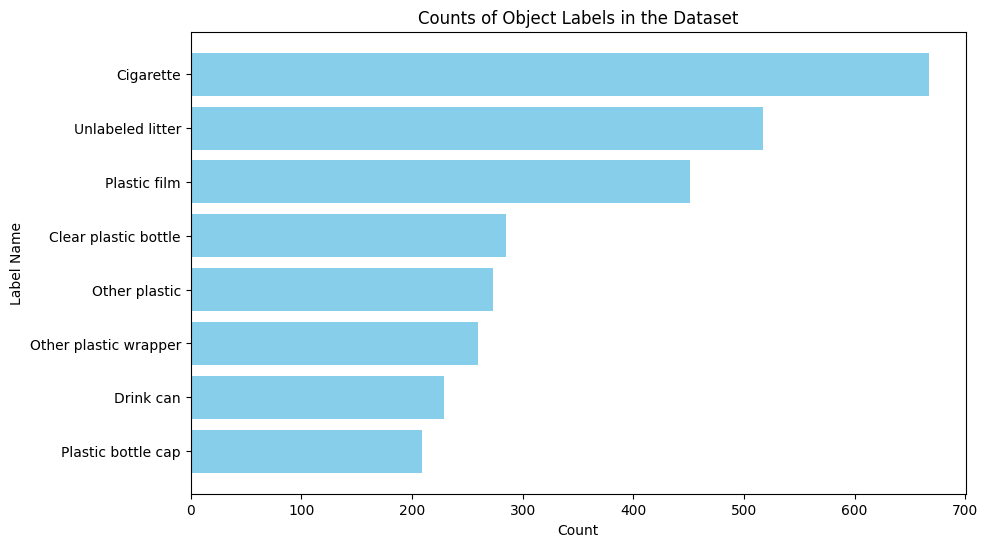

In [14]:
import os
import matplotlib.pyplot as plt
from collections import Counter

# Define a mapping from label IDs to names
label_names = {
    0: "Plastic film",
    1: "Unlabeled litter",
    2: "Cigarette",
    3: "Clear plastic bottle",
    4: "Plastic bottle cap",
    5: "Other plastic wrapper",
    6: "Other plastic",
    7: "Drink can"
}

# Initialize a counter for label counts across the entire dataset
label_counts = Counter()

# Loop over each label file in the labels directory
for label_file in os.listdir(label_dir):
    label_file_path = os.path.join(label_dir, label_file)

    # Read the label file
    with open(label_file_path, 'r') as file:
        lines = file.readlines()

        # Count each label in the file
        for line in lines:
            parts = line.strip().split()
            label_id = int(parts[0])  # The label ID is the first element
            label_counts[label_id] += 1

# Convert label IDs to label names and sort by count
labels, counts = zip(*sorted(
    [(label_names[label_id], count) for label_id, count in label_counts.items()],
    key=lambda x: x[1]
))

# Plotting a horizontal bar chart for the entire dataset
plt.figure(figsize=(10, 6))
plt.barh(labels, counts, color='skyblue')
plt.xlabel("Count")
plt.ylabel("Label Name")
plt.title("Counts of Object Labels in the Dataset")
plt.show()


In [15]:
import os

# Paths to the images and labels directories
image_dir = os.path.join(base_dir, 'images')
label_dir = os.path.join(base_dir, 'labels')

# Count the total number of images and labels
num_images = len([f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))])
num_labels = len([f for f in os.listdir(label_dir) if os.path.isfile(os.path.join(label_dir, f))])

print(f"Total number of images: {num_images}")
print(f"Total number of labels: {num_labels}")

Total number of images: 1086
Total number of labels: 1086


In [16]:
import shutil
import random

# Set the split ratios
train_ratio = 0.7
val_ratio = 0.2
test_ratio = 0.1

# Ensure output directories for each split
for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(base_dir, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(base_dir, split, 'labels'), exist_ok=True)

# Get a list of all images and shuffle them
all_images = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]
random.shuffle(all_images)

# Calculate split sizes
num_train = int(len(all_images) * train_ratio)
num_val = int(len(all_images) * val_ratio)

# Assign images to each split
train_images = all_images[:num_train]
val_images = all_images[num_train:num_train + num_val]
test_images = all_images[num_train + num_val:]

# Move files to their respective split directories
for split, images in zip(['train', 'val', 'test'], [train_images, val_images, test_images]):
    for image_file in images:
        # Move image file
        src_image_path = os.path.join(image_dir, image_file)
        dst_image_path = os.path.join(base_dir, split, 'images', image_file)
        shutil.move(src_image_path, dst_image_path)

        # Move corresponding label file
        label_file = os.path.splitext(image_file)[0] + '.txt'
        src_label_path = os.path.join(label_dir, label_file)
        dst_label_path = os.path.join(base_dir, split, 'labels', label_file)
        if os.path.exists(src_label_path):  # Ensure corresponding label file exists
            shutil.move(src_label_path, dst_label_path)

# Print the number of images in each split
print(f"Number of images in train: {len(train_images)}")
print(f"Number of images in val: {len(val_images)}")
print(f"Number of images in test: {len(test_images)}")

Number of images in train: 760
Number of images in val: 217
Number of images in test: 109


In [17]:
# Paths to the original images and labels directories
image_dir = os.path.join(base_dir, 'images')
label_dir = os.path.join(base_dir, 'labels')

# Delete the original images and labels directories
if os.path.exists(image_dir):
    shutil.rmtree(image_dir)

if os.path.exists(label_dir):
    shutil.rmtree(label_dir)

print("Original images and labels directories have been deleted.")

Original images and labels directories have been deleted.


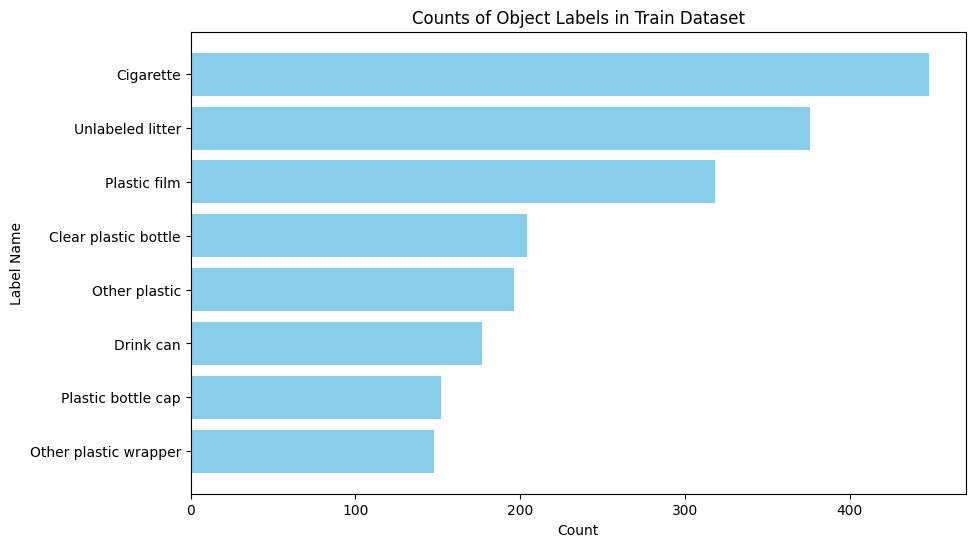

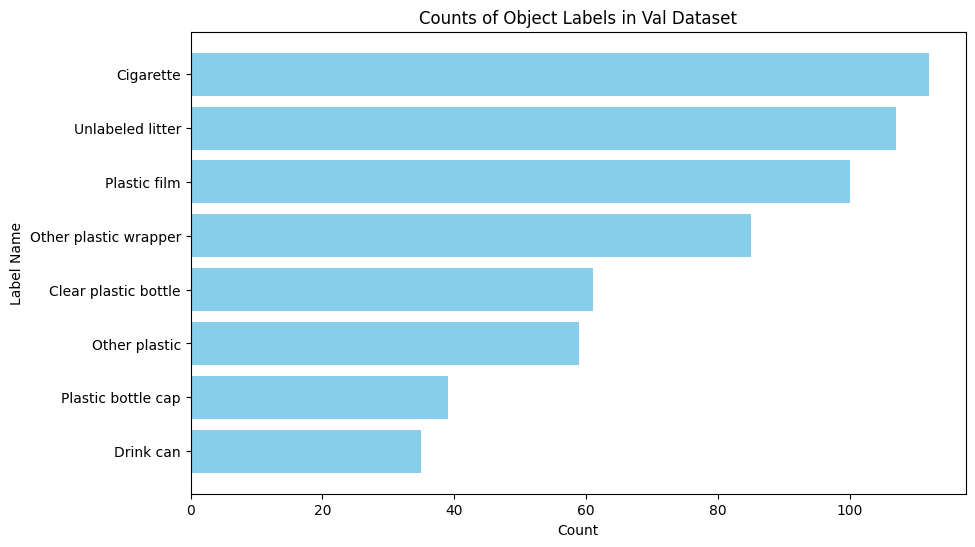

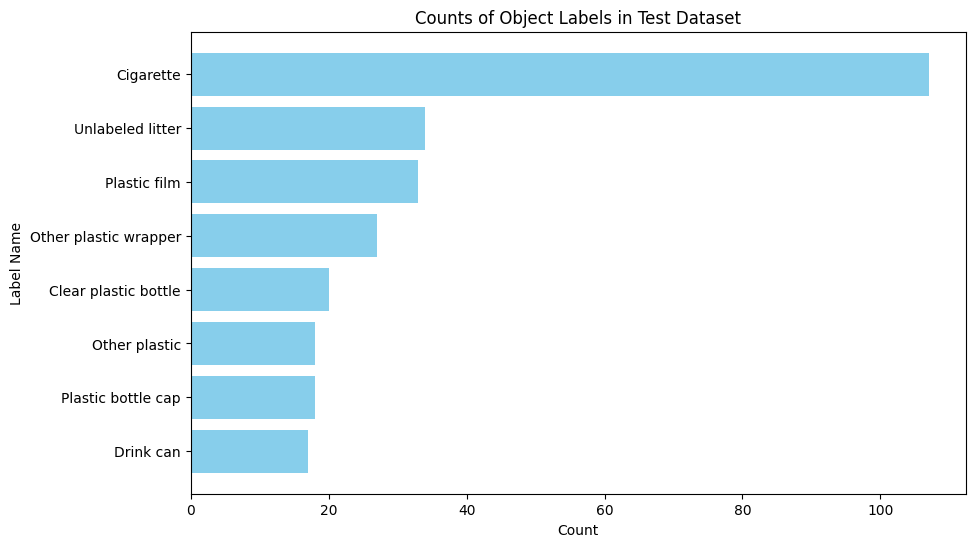

In [18]:
# Function to plot label counts for a given split
def plot_label_counts(split, label_counts):
    # Convert label IDs to label names and sort by count
    labels, counts = zip(*sorted(
        [(label_names[label_id], count) for label_id, count in label_counts.items()],
        key=lambda x: x[1]
    ))

    # Plotting a horizontal bar chart for the split
    plt.figure(figsize=(10, 6))
    plt.barh(labels, counts, color='skyblue')
    plt.xlabel("Count")
    plt.ylabel("Label Name")
    plt.title(f"Counts of Object Labels in {split.capitalize()} Dataset")
    plt.show()

# Loop through each split and calculate label distributions
for split in ['train', 'val', 'test']:
    label_dir_split = os.path.join(base_dir, split, 'labels')

    # Initialize a counter for label counts for the current split
    label_counts = Counter()

    # Loop over each label file in the current label directory
    for label_file in os.listdir(label_dir_split):
        label_file_path = os.path.join(label_dir_split, label_file)

        # Read the label file
        with open(label_file_path, 'r') as file:
            lines = file.readlines()

            # Count each label in the file
            for line in lines:
                parts = line.strip().split()
                label_id = int(parts[0])  # The label ID is the first element
                label_counts[label_id] += 1

    # Plot label counts for the current split
    plot_label_counts(split, label_counts)


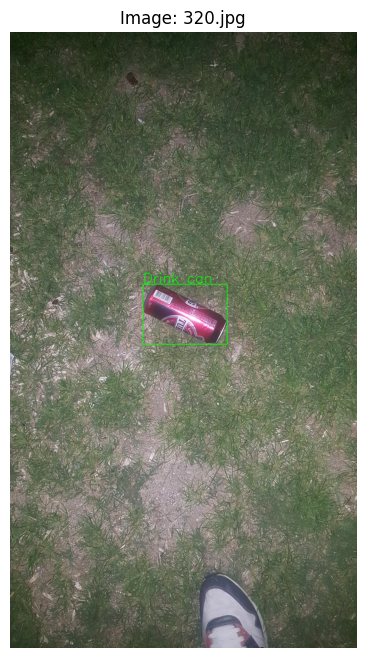

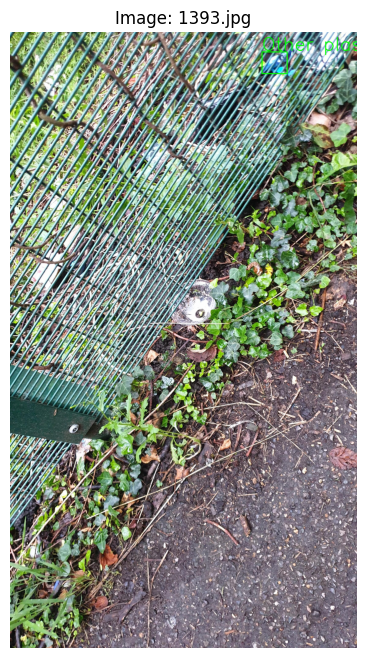

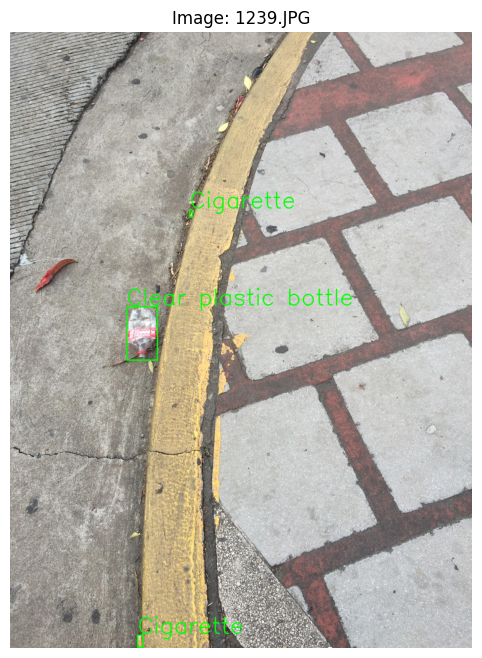

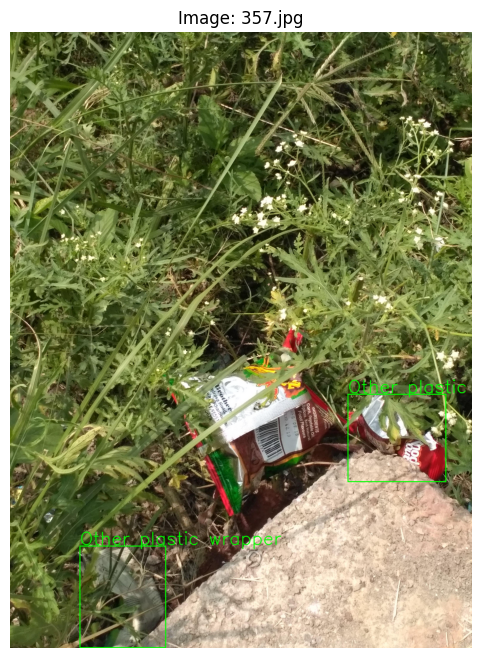

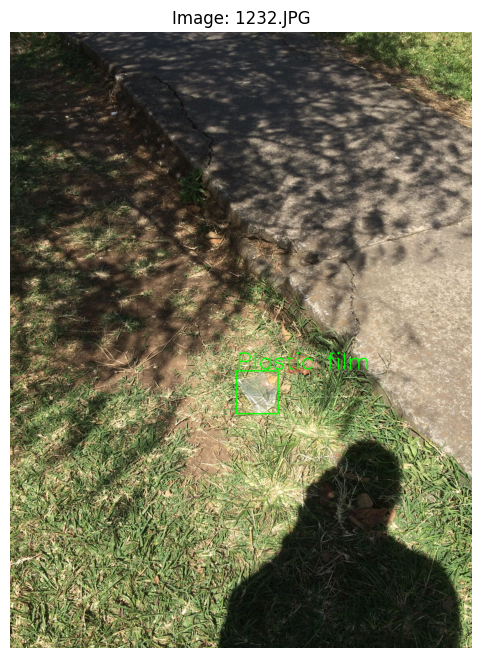

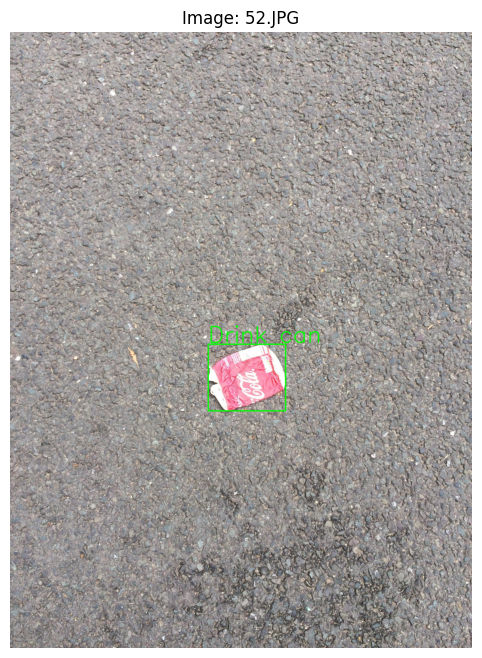

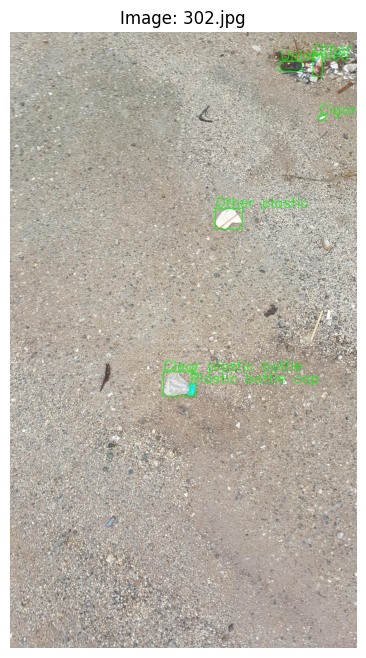

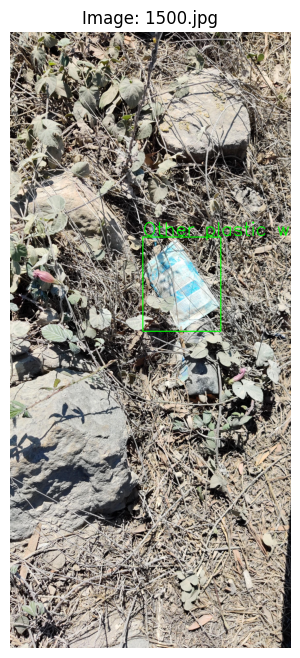

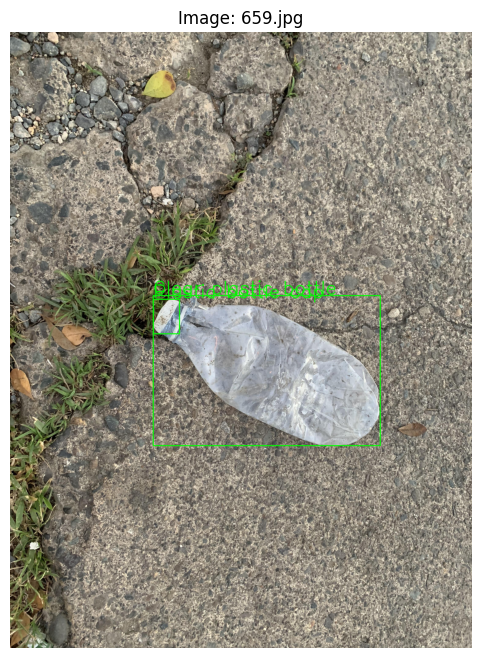

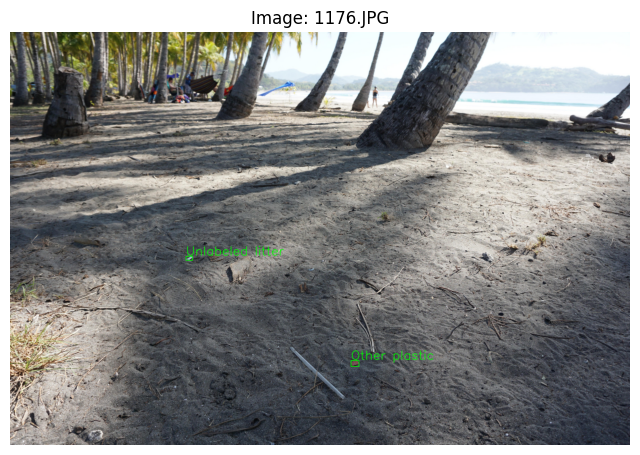

In [19]:
import os
import cv2  # OpenCV is required for this code to run
import matplotlib.pyplot as plt

# Define the class names for each label ID
label_names = {
    0: "Plastic film",
    1: "Unlabeled litter",
    2: "Cigarette",
    3: "Clear plastic bottle",
    4: "Plastic bottle cap",
    5: "Other plastic wrapper",
    6: "Other plastic",
    7: "Drink can"
}

# Paths to the train images and labels directories
train_image_dir = os.path.join(base_dir, 'train', 'images')
train_label_dir = os.path.join(base_dir, 'train', 'labels')

# Define the number of images to display
num_images_to_display = 10

# Get a list of all images in the train set and select the first 10
all_images = [f for f in os.listdir(train_image_dir) if f.endswith(('.jpg', '.jpeg', '.png', '.JPG', '.JPEG', '.PNG'))]
selected_images = all_images[:num_images_to_display]

# Plot each selected image with bounding boxes
for image_file in selected_images:
    # Load the image
    image_path = os.path.join(train_image_dir, image_file)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB for matplotlib

    # Load corresponding label file
    label_file = os.path.splitext(image_file)[0] + '.txt'
    label_path = os.path.join(train_label_dir, label_file)

    # Get image dimensions
    height, width, _ = image.shape

    # Read and draw bounding boxes from the label file
    if os.path.exists(label_path):
        with open(label_path, 'r') as file:
            for line in file:
                parts = line.strip().split()
                class_id = int(parts[0])  # The label ID
                x_center, y_center, box_width, box_height = map(float, parts[1:])

                # Convert YOLO format to pixel coordinates
                x1 = int((x_center - box_width / 2) * width)
                y1 = int((y_center - box_height / 2) * height)
                x2 = int((x_center + box_width / 2) * width)
                y2 = int((y_center + box_height / 2) * height)

                # Draw the bounding box on the image
                color = (0, 255, 0)  # Green color for bounding box
                thickness = 5  # Thickness of the bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), color, thickness)

                # Get the label name from the dictionary
                label_text = label_names.get(class_id, "Unknown")

                # Set the font scale for the text
                font_scale = 4
                cv2.putText(image, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, font_scale, color, thickness)

    # Display the image with bounding boxes
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Image: {image_file}")
    plt.show()

In [20]:
import os

# Directories for each split
splits = ['train', 'val', 'test']
total_objects = 0
total_images = 0

# Loop through each split directory
for split in splits:
    image_dir = os.path.join(base_dir, split, 'images')
    label_dir = os.path.join(base_dir, split, 'labels')

    # Process each image in the current split
    for image_file in os.listdir(image_dir):
        label_file = os.path.splitext(image_file)[0] + '.txt'
        label_path = os.path.join(label_dir, label_file)

        # Check if the corresponding label file exists
        if os.path.exists(label_path):
            total_images += 1  # Increment image count
            with open(label_path, 'r') as file:
                # Count the number of lines (objects) in the label file
                object_count = sum(1 for line in file)
                total_objects += object_count

# Calculate the average number of objects per image
average_objects_per_image = total_objects / total_images if total_images > 0 else 0

print(f"Total number of images: {total_images}")
print(f"Total number of objects: {total_objects}")
print(f"Average number of objects per image: {average_objects_per_image:.2f}")

Total number of images: 1086
Total number of objects: 2891
Average number of objects per image: 2.66


In [21]:
import yaml

# Define the details for the YAML file
data_config = {
    'train': '/content/yolo_top_categories/train/images',
    'val': '/content/yolo_top_categories/val/images',
    'test': '/content/yolo_top_categories/test/images',
    'nc': 8,  # Number of classes
    'names': [
        "Plastic film",
        "Unlabeled litter",
        "Cigarette",
        "Clear plastic bottle",
        "Plastic bottle cap",
        "Other plastic wrapper",
        "Other plastic",
        "Drink can"
    ]
}

# Write to a YAML file
yaml_file_path = 'taco.yaml'  # Path where the YAML file will be saved
with open(yaml_file_path, 'w') as file:
    yaml.dump(data_config, file, default_flow_style=False)

print(f"YAML file created at: {yaml_file_path}")

YAML file created at: taco.yaml


In [22]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.8/883.8 kB 59.1 MB/s eta 0:00:00


In [23]:
from ultralytics import YOLO

# Path to the YAML configuration file
data_yaml = 'taco.yaml'  # Update with the path to your taco.yaml file
model_type = 'yolov8l.pt'  # You can use other YOLOv8 models like yolov8s.pt, yolov8m.pt, etc.

# Load a pre-trained YOLOv8 model
model = YOLO(model_type)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 83.7M/83.7M [00:02<00:00, 40.3MB/s]


In [24]:
# Train the model
model.train(
    data=data_yaml,
    epochs=100,
    imgsz=1536,
    batch=16,
    patience=15,
    freeze=10,
    augment=True
)

Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=taco.yaml, epochs=100, time=None, patience=15, batch=16, imgsz=1536, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=

100%|██████████| 755k/755k [00:00<00:00, 129MB/s]


Overriding model.yaml nc=80 with nc=8

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 338MB/s]


AMP: checks passed ✅


train: Scanning /content/yolo_top_categories/train/labels... 760 images, 0 backgrounds, 0 corrupt: 100%|██████████| 760/760 [00:00<00:00, 1074.54it/s]

train: New cache created: /content/yolo_top_categories/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/yolo_top_categories/val/labels... 217 images, 0 backgrounds, 0 corrupt: 100%|██████████| 217/217 [00:00<00:00, 870.12it/s]

val: New cache created: /content/yolo_top_categories/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1536 train, 1536 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      20.1G      1.109      5.218      1.255         43       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:12<00:00,  1.84s/it]

                   all        217        598      0.142      0.229        0.1     0.0709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      19.5G      1.215      3.849      1.322         48       1536: 100%|██████████| 48/48 [01:21<00:00,  1.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.61s/it]

                   all        217        598      0.185      0.185      0.101     0.0654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      19.5G      1.256      2.977      1.353         23       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:19<00:00,  2.85s/it]

                   all        217        598       0.12      0.192     0.0781     0.0465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      19.5G      1.272      2.675      1.321         27       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:12<00:00,  1.74s/it]

                   all        217        598      0.244      0.292      0.168     0.0954



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      19.9G      1.261      2.353      1.372         28       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.63s/it]

                   all        217        598        0.3      0.234      0.187      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      19.5G      1.202      2.151      1.297         36       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.62s/it]

                   all        217        598       0.34       0.26      0.216      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      19.2G      1.157      2.056      1.279         48       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.61s/it]

                   all        217        598      0.285      0.293      0.218      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      19.7G      1.096      1.972      1.241         46       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.58s/it]

                   all        217        598      0.295      0.297      0.221       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      20.2G      1.086      1.784      1.225         17       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.58s/it]

                   all        217        598      0.301      0.328      0.245      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      19.8G      1.066      1.719       1.23         19       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        217        598      0.309      0.284      0.232      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      19.9G      1.065      1.669      1.203         45       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598        0.3      0.335      0.261      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      19.5G      1.013      1.526      1.167         34       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598      0.341      0.284      0.249      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      18.9G     0.9882      1.428      1.159         23       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598      0.361      0.277      0.236      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      18.5G     0.9375      1.381       1.14         58       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598      0.315      0.312      0.239      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      18.5G     0.9471      1.317      1.138         25       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        217        598      0.281      0.348      0.247      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      18.9G     0.9207      1.253      1.109         41       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        217        598      0.337      0.291      0.246      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      18.9G       0.92      1.262      1.131         19       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598      0.407      0.327      0.301      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      19.7G     0.8918       1.16      1.081         42       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598      0.308      0.339      0.252      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      19.9G     0.9158      1.171      1.103         39       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.56s/it]

                   all        217        598       0.35      0.328      0.269      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      20.7G     0.8913      1.113      1.089         78       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598      0.319      0.324      0.262      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      19.6G     0.8728     0.9909      1.066         26       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        217        598      0.368      0.344      0.286      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      19.9G     0.8351     0.9542      1.048         14       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        217        598      0.325       0.34      0.266      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      18.9G     0.8269     0.9688      1.066         26       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        217        598       0.31      0.354      0.271      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      19.6G     0.8226     0.9579      1.076         22       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598       0.32      0.346      0.255      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      19.7G     0.8244     0.9479      1.065         17       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        217        598       0.34      0.333      0.268      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      20.6G      0.809     0.9046      1.039         38       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598      0.347      0.348      0.273      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      20.8G     0.7893     0.8914      1.039         39       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598      0.344      0.342      0.272        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      19.7G     0.7893     0.8652      1.033         24       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        217        598      0.324      0.375      0.261      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      18.8G     0.7732     0.8174      1.026         63       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598      0.349      0.355      0.279      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      20.5G      0.752      0.816      1.018         25       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        217        598      0.411      0.311      0.292      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      20.9G     0.7671     0.8195      1.027         24       1536: 100%|██████████| 48/48 [01:21<00:00,  1.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.57s/it]

                   all        217        598      0.342       0.32      0.277      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      20.1G     0.7588     0.7664      1.009         29       1536: 100%|██████████| 48/48 [01:21<00:00,  1.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:10<00:00,  1.57s/it]

                   all        217        598      0.307      0.366      0.273      0.188
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 17, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



32 epochs completed in 0.839 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 87.8MB
Optimizer stripped from runs/detect/train/weights/best.pt, 87.8MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Model summary (fused): 268 layers, 43,612,776 parameters, 0 gradients, 164.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:23<00:00,  3.30s/it]


                   all        217        598      0.405      0.363       0.32      0.235
          Plastic film         64        100      0.309       0.45        0.3      0.219
      Unlabeled litter         55        107      0.186      0.215     0.0841     0.0458
             Cigarette         46        112      0.626      0.411      0.443      0.252
  Clear plastic bottle         51         61      0.683      0.494      0.574      0.466
    Plastic bottle cap         36         39      0.385      0.513      0.458      0.352
 Other plastic wrapper         47         85      0.351      0.129      0.202      0.121
         Other plastic         33         59      0.392      0.153       0.15      0.132
             Drink can         27         35      0.306      0.543      0.345      0.289
Speed: 0.7ms preprocess, 100.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ddcb009d0f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,